In [8]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import os
import random
import warnings
import numpy as np
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from utils4 import get_features
from predict import binarize
import pandas as pd
from scipy.io import loadmat
from scipy.signal import welch
import seaborn as sns
from tsfresh.feature_extraction import  feature_calculators as ftc
from scipy.signal import find_peaks, peak_prominences
from scipy.stats import skew, kurtosis
from scipy import signal
from scipy.signal import spectrogram
from scipy.fftpack import fft
from preprocess import preprocess, preprocess_without_std
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from skrebate import ReliefF
from sklearn.neighbors import KNeighborsClassifier
warnings.filterwarnings('ignore', message='invalid value encountered in log10')

In [175]:
def print_package_versions():
    import numpy as np
    import matplotlib
    import sklearn
    import os
    import random
    import warnings
    import xgboost
    import pandas as pd
    import scipy
    import seaborn as sns
    import tsfresh
    import skrebate

    packages = {
        "numpy": np,
        "matplotlib": matplotlib,
        "sklearn": sklearn,
        "os": os,
        "random": random,
        "warnings": warnings,
        "xgboost": xgboost,
        "pandas": pd,
        "scipy": scipy,
        "seaborn": sns,
        "tsfresh": tsfresh,
        "skrebate": skrebate
    }

    for package_name, package in packages.items():
        try:
            print(f"{package_name}: {package.__version__}")
        except AttributeError:
            print(f"{package_name}: version not available")

In [176]:
print_package_versions()

numpy: 1.26.1
matplotlib: 3.7.2
sklearn: 1.3.0
os: version not available
random: version not available
warnings: version not available
xgboost: 1.7.6
pandas: 2.0.3
scipy: 1.11.2
seaborn: 0.12.2
tsfresh: 0.20.1
skrebate: 0.62


## Dataframe of all signals

##### According to the documents on Z24 only R1V, R2L, R2T, R2V, R3V are present in every setup. Other sensors are moved around during every setup making them difficult to use as reliable channels

In [2]:
def get_avt_files(root):
    folder_path = root
    file_list = os.listdir(folder_path)
    avt_files = []

    # walk inside data folder
    for filename in file_list:
        full_path = os.path.join(folder_path, filename)
        # walk inside data/[number]
        file_nest_list = os.listdir(full_path)
        for filename_1 in file_nest_list:
            if filename_1 != "avt":
                continue
            else:
                # full_path_2 is of the form C:\Users\amroa\Documents\thesis\data\01\avt
                full_path_2 = os.path.join(full_path, filename_1)
                setup_filenames = [filename for filename in os.listdir(full_path_2) if "setup" in filename]
                for avt_file in setup_filenames:
                    full_path_3 = os.path.join(full_path_2, avt_file) # full_path_3 is of the form C:\Users\amroa\Documents\thesis\data\01\avt\01setup09.mat
                    avt = loadmat(full_path_3)
                    avt_files.append(avt)
    return avt_files

In [6]:
def get_dataframes(avt_files):
    """
    This method returns a list of dataframes # type: ignore
    A dataframe is of the form: # type: ignore
    R1V R2L ... R3V  (column names)
    0.1 0.3 ... 0.12
    0.4 0.1 ... 0.22 
    """
    good_sensors = ['R1V ', 'R2L ', 'R2T ', 'R2V ', 'R3V ']
    result = pd.DataFrame(columns=good_sensors)
    list_df = [] # should contain 17 entries, one for each damage state 

    # get pandas dataframes
    for idx, avt in enumerate(avt_files):
        # get index of the good sensor/positions
        arr_sensors = avt['labelshulp']
        bool_array = np.isin(arr_sensors, good_sensors) #  will contain True if entry corresponds to a good sensor
        indices_good_sensors = np.where(bool_array)[0]

        # Create a Pandas DataFrame
        df = pd.DataFrame(data=avt['data'][:, indices_good_sensors], columns=arr_sensors[indices_good_sensors])
        result = pd.concat([result, df], ignore_index=True)

        if (idx+1) % 9 == 0:
            # Most of the dataframes are 589824 except for 4 of them
            # Mirror the top part to the bottom to achive the same length
            top_rows = result.head(589824 - len(result))

            # Concatenate the sliced rows to the bottom of the original DataFrame
            new_res = pd.concat([result, top_rows], ignore_index=True)

            list_df.append(new_res)
            result = pd.DataFrame(columns=good_sensors)

    return list_df

In [7]:
avt_files = get_avt_files(os.environ["Z24_DATA"])
dfs = get_dataframes(avt_files)

In [55]:
# Function takes as input window size (16384), the dataframes containing the data, test_split is 1 and window_size is 16384 means 1 out of (589,824/16,384) of the data is used for testing
def get_train_test(dataframes, standardize = True, test_split = 4, window_size = 16384):
    preprocess_function = (lambda x : preprocess(x)) if standardize else (lambda x : preprocess_without_std(x))
    labels_train = np.array([])
    labels_test = np.array([])
    train_data = []
    test_data = []

    for idx, df in enumerate(dataframes):
        random.seed(idx)
        nbr_splits = int(len(df)//window_size)  # test_split of these will be used for testing. len(df) = 589,824. nbr_splits = 36
        test_indices = random.sample(range(nbr_splits), test_split)
        train_indices = [x for x in range(nbr_splits) if x not in test_indices]
        for i in train_indices:
            labels_train = np.append(labels_train, idx)
            train_data_i = df.iloc[i*window_size: (i+1)*window_size].values
            data_i = np.apply_along_axis(preprocess_function, axis = 0, arr= train_data_i)
            train_data.append(data_i)
        for i in test_indices:
            labels_test = np.append(labels_test, idx)
            test_data_i = df.iloc[i*window_size: (i+1)*window_size].values
            data_i = np.apply_along_axis(preprocess_function, axis= 0, arr= test_data_i)
            test_data.append(data_i)

    return np.array(train_data), labels_train, np.array(test_data), labels_test 


In [56]:
train_data, labels_train, test_data, labels_test = get_train_test(dfs, standardize=False)

In [ ]:
test_data.shape, train_data.shape, labels_train.shape

## Spectrogram

We take the average spectrogram of each damage class

In [58]:
def plot_spectrogram(signals, title):
    fs = 100  # 100 samples/second
    T = 1.0 / fs  # time between consecutive samples
    t = np.arange(0, len(signals[0])/fs, T)  # time vector

    n_rows = 4  
    n_cols = 5  
    fig = plt.figure(figsize=(15, 15))
    fig.suptitle(title, fontsize=20, y = 1.01)  # Title for the entire plot

    # iterate through the signals
    for i in range(len(signals)):
        
        # the i'th preprocessed signal 
        y = signals[i]
        
        # calculate the spectrogram
        f, t_spec, Sxx = spectrogram(y, fs)
        
        # select subplot
        plt.subplot(n_rows, n_cols, i+1)
        plt.pcolormesh(t_spec, f, 10*np.log10(Sxx), shading = 'gouraud')
        plt.ylabel('Freq [Hz]')
        plt.xlabel('Time [s]')
        plt.title(f'State {i+1}')
        plt.colorbar(label='dB', orientation='horizontal', pad=0.2)

    # put spacing between subplots
    plt.tight_layout()
    # adjust subplots so they don't overlap with the main title
    plt.subplots_adjust(top= 0.95)
    plt.show()

In [59]:
def plot_morlet(signals, title):
    fs = 100  # 100 samples/second
    T = 1.0 / fs  # time between consecutive samples
    t = np.arange(0, len(signals[0])/fs, T)  # time vector

    n_rows = 4  
    n_cols = 5  
    fig = plt.figure(figsize=(15, 15))
    fig.suptitle(title, fontsize=20, y = 1.01)  # Title for the entire plot

    # iterate through the signals
    for i in range(len(signals)):
        
        # the i'th preprocessed signal 
        #y = signals[i]
        
        # calculate the spectrogram
        #f, t_spec, Sxx = spectrogram(y, fs)
        t = np.arange(0, len(signals[0][:16384])/fs, T)  # time vector (we had to shorten this a bit to prevent memory error)
        fs = 100
        w = 3
        sig = (signals[i])[:16384]
        freq = np.linspace(0.01, fs/2, 100)
        widths = w*fs / (2*freq*np.pi)
        cwtm = signal.cwt(sig, signal.morlet2, widths = widths)
        
        # select subplot
        plt.subplot(n_rows, n_cols, i+1)
        img = plt.pcolormesh(t, freq, 10*np.log10(np.abs(cwtm)), cmap='viridis', shading='gouraud')
        plt.ylabel('Freq [Hz]')
        plt.xlabel('Time [s]')
        plt.title(f'State {i+1}')
        plt.colorbar(label='dB', orientation='horizontal', pad=0.2)

    # put spacing between subplots
    plt.tight_layout()
    # adjust subplots so they don't overlap with the main title
    plt.subplots_adjust(top= 0.95)
    plt.show()

In [133]:
# Apply preprocess column wise
dfs_preprocessed = [df.apply(preprocess, axis=0) for df in dfs] 

In [134]:
# take only signals from R3V to plot their spectrogram
r3v_signals = [df.iloc[:, -1].values for df in dfs_preprocessed]

# take signals from R2V
r2v_signals = [df.iloc[:, 3].values for df in dfs_preprocessed]

# take signals from R2T
r2t_signals = [df.iloc[:, 2].values for df in dfs_preprocessed]

# take signals from R2L
r2L_signals = [df.iloc[:, 1].values for df in dfs_preprocessed]

# take signals from R1V
r1v_signals = [df.iloc[:, 0].values for df in dfs_preprocessed]

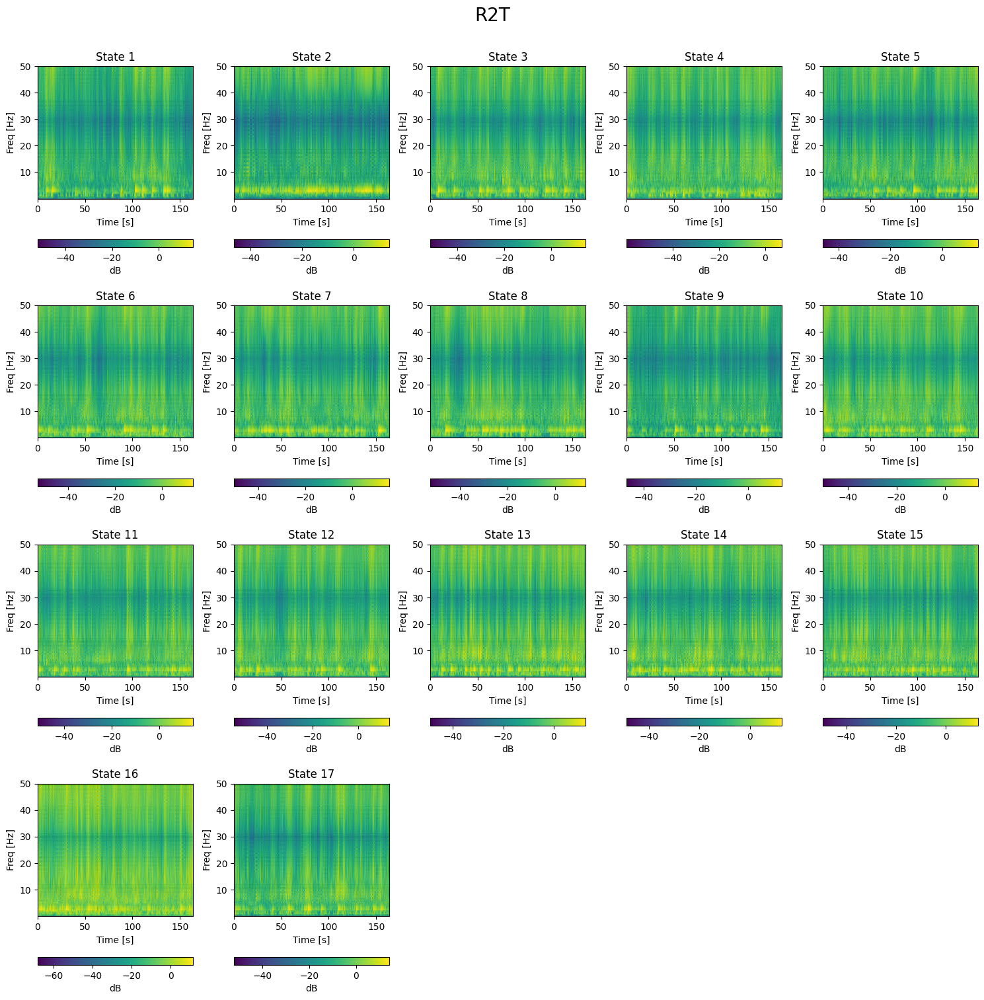

In [20]:
plot_morlet(r2t_signals, "R2T")

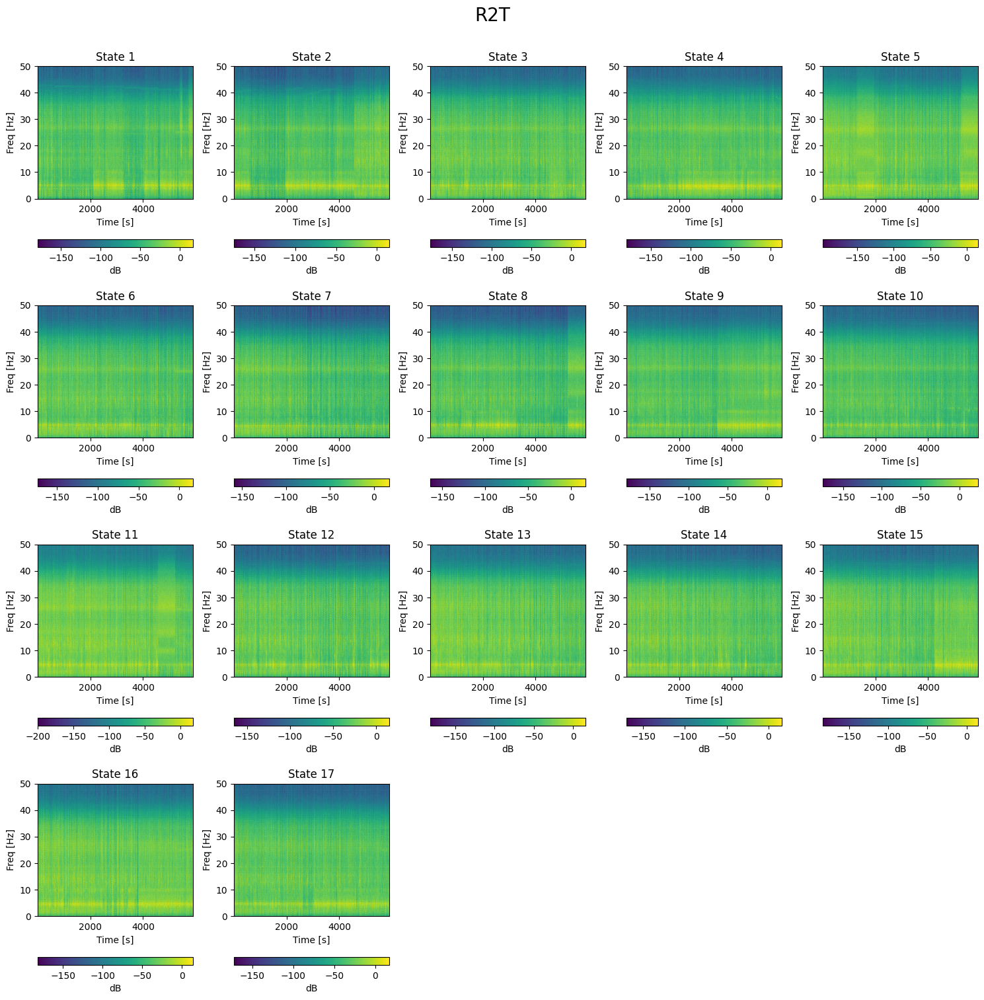

In [21]:
plot_spectrogram(r2t_signals, "R2T")

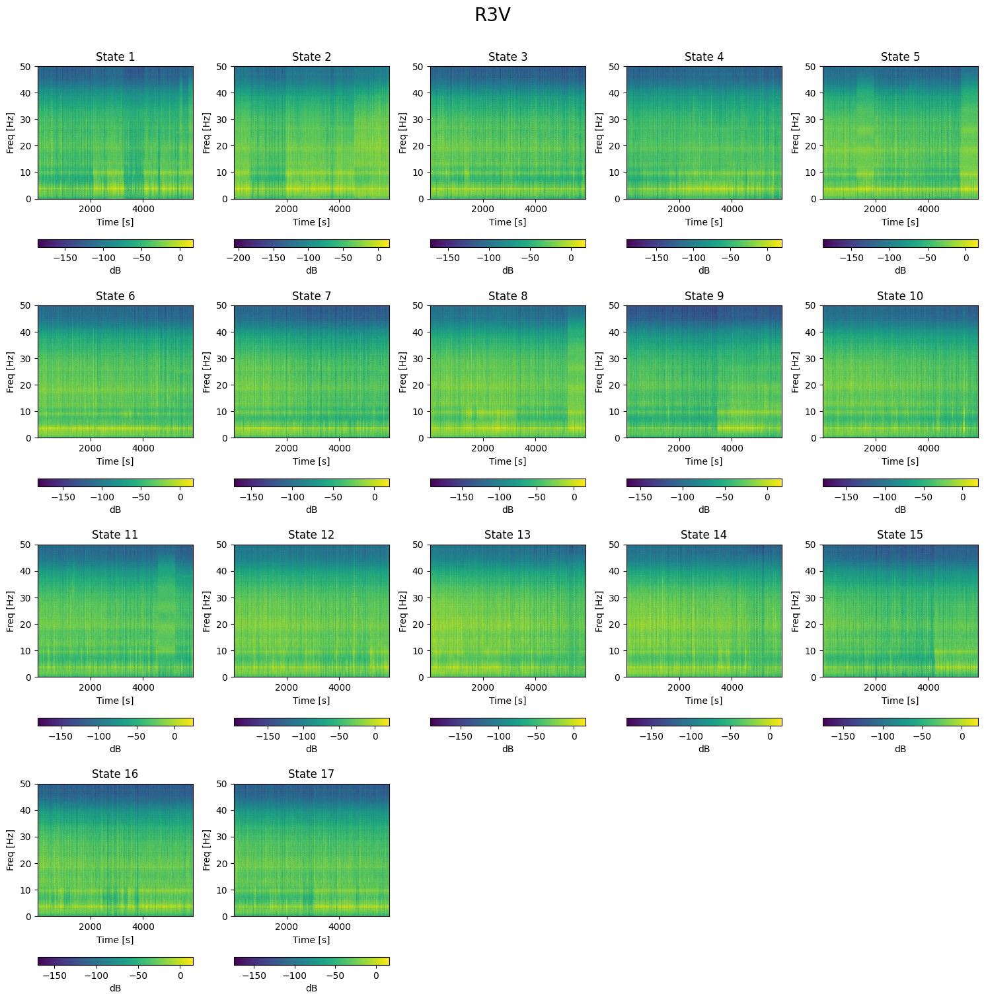

In [22]:
plot_spectrogram(r3v_signals, "R3V")

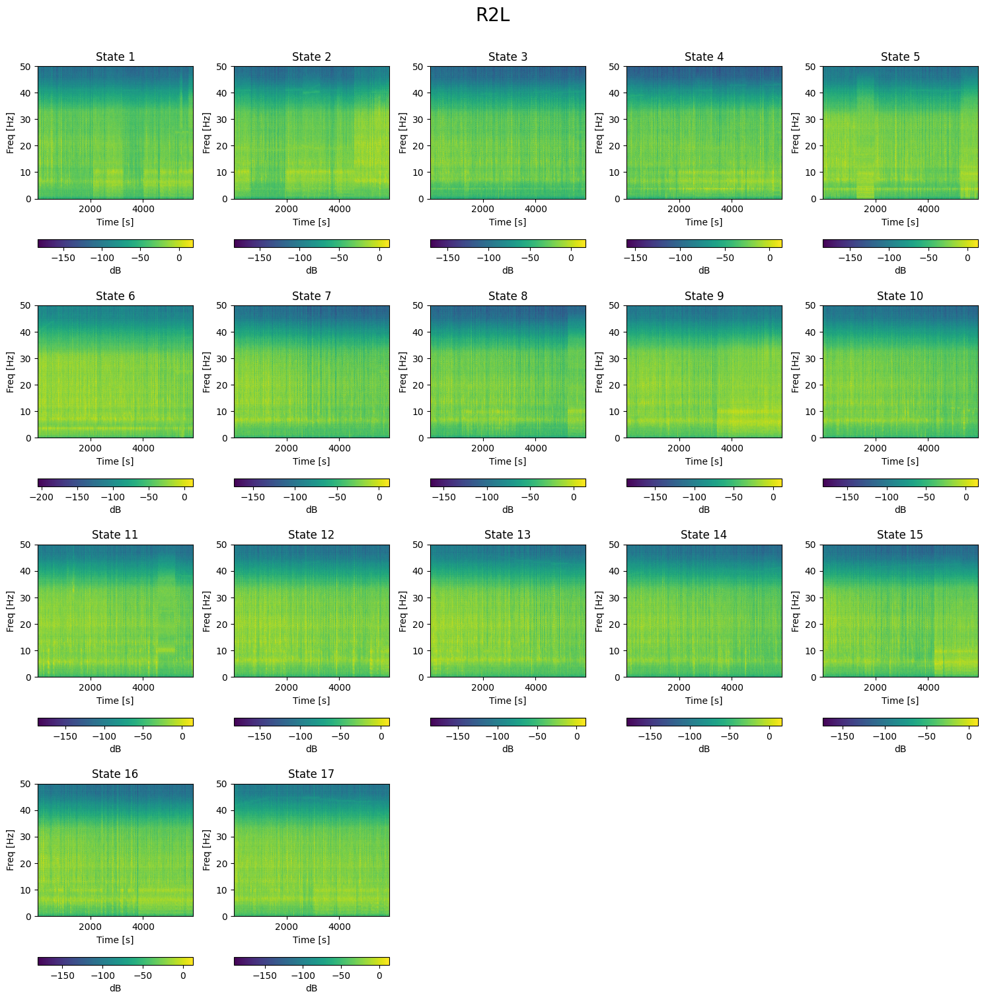

In [56]:
plot_spectrogram(r2L_signals, "R2L")

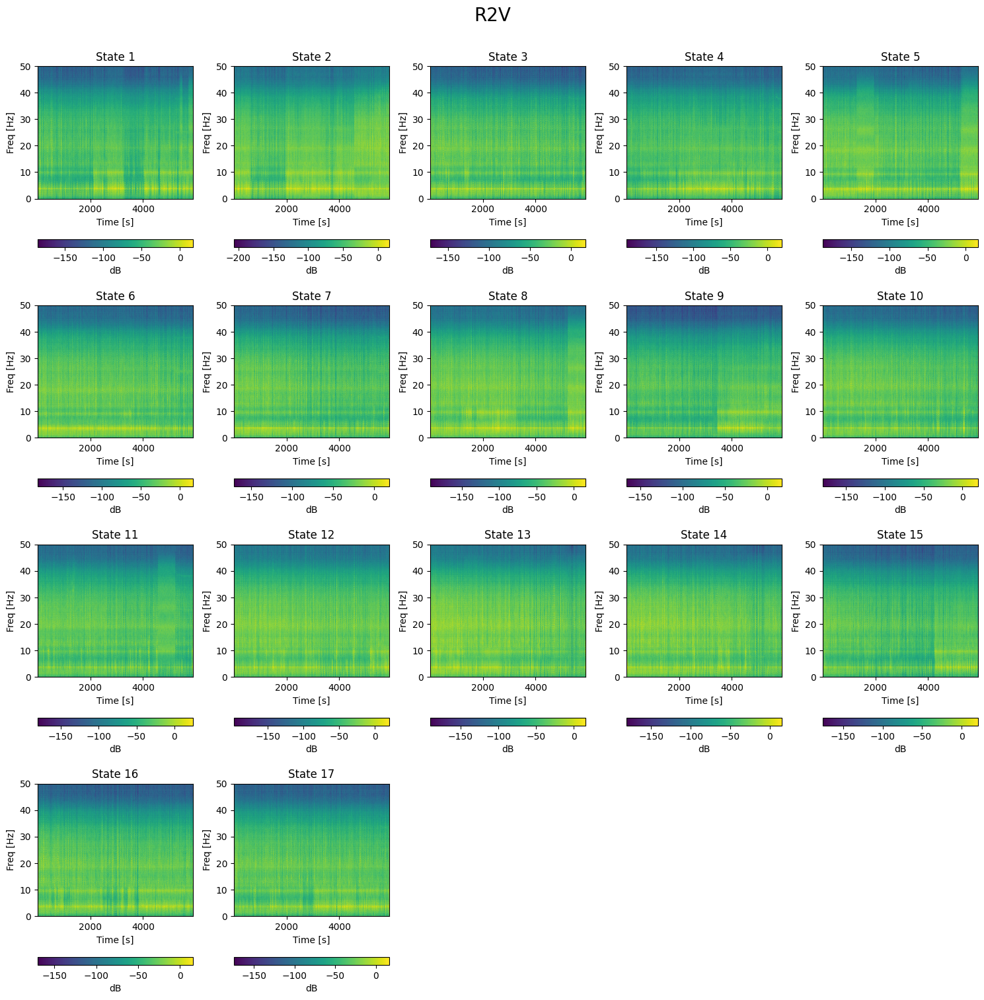

In [23]:
plot_spectrogram(r3v_signals, "R2V")

## ⚡ Fast Fourier Transform 

In [135]:
list_sensor_directions = dfs_preprocessed[0].columns.tolist()
list_sensor_directions

['R1V ', 'R2L ', 'R2T ', 'R2V ', 'R3V ']

In [145]:
def plot_fft(dfs_preprocessed):
    fs = 100 #  the sample rate
    title = "Fast Fourier Transform"

    fig, axes = plt.subplots(5, 1, figsize=(10, 6*5))
    fig.suptitle(title, fontsize=20, y = 1.006)

    # Loop through the subplots
    for idx, ax in enumerate(axes):
        
        # The order is R1V, R2L, R2T, R2V, R3V
        signals = [df.iloc[:, idx].values for df in dfs_preprocessed]

        # Plot 17 line plots on the current subplot
        for i in range(17):

            # this should be constant for all signals around ~500,000
            n = len(signals[i])
            freqs = np.fft.fftfreq(n, 1/fs)[:n//2]
            yf = fft(signals[i])

            # Amplitude Spectrum
            amplitude_spectrum = np.abs(yf)[:n//2]

            # cycle thru a colormap
            unique_color = plt.cm.jet(i / 17)
            
            sns.lineplot(x=freqs, y=amplitude_spectrum, label=f'State {i+1}', color=unique_color, ax=ax,alpha =0.5)
            ax.set_xlabel('Frequency (Hz)')
            ax.set_ylabel('Amplitude')
            ax.set_title(f'Fourier Transform of DS Classes using {list_sensor_directions[idx]}')
            ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

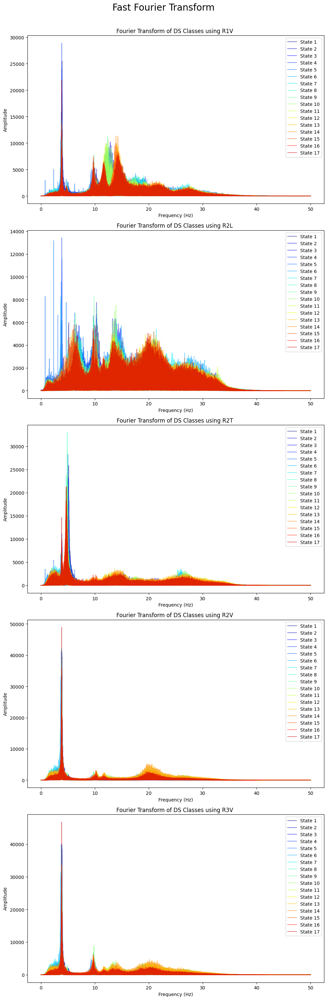

In [146]:
plot_fft(dfs_preprocessed)

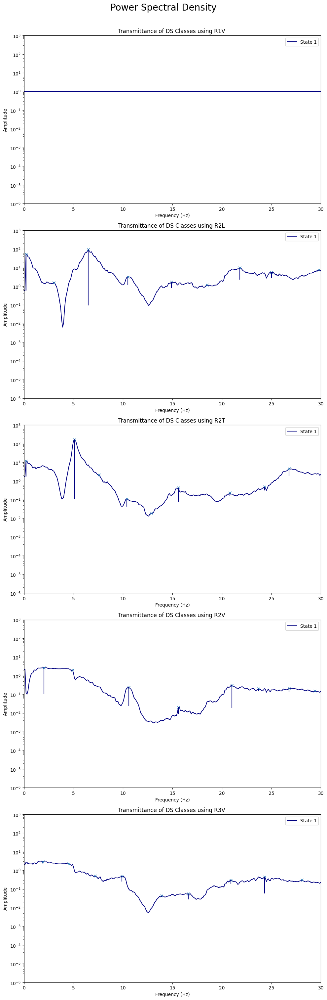

In [144]:
def plot_pwelch(dfs_preprocessed):
    fs = 100 #  the sample rate
    title = "Power Spectral Density"

    fig, axes = plt.subplots(5, 1, figsize=(10, 6*5))
    fig.suptitle(title, fontsize=20, y = 1.006)

    # Loop through the subplots
    signals0 = [df.iloc[:, 0].values for df in dfs_preprocessed]
    for idx, ax in enumerate(axes):
        
        # The order is R1V, R2L, R2T, R2V, R3V
        signals = [df.iloc[:, idx].values for df in dfs_preprocessed]

        # Plot 17 line plots on the current subplot
        for i in range(1):

            # This should be constant for all signals (around ~500,000)
            n = len(signals[i])

            freqs, amplitude_spectrum = welch(signals[i], fs,nperseg= 1000) # nperseg = 1000 for training to prevent noise with smaller sample sizes
            _, amplitude_spectrum0 = welch(signals0[i], fs,nperseg= 1000)
            # cycle thru a colormap
            unique_color = plt.cm.jet(i / 17)
            #sns.lineplot(x=freqs, y=(amplitude_spectrum), label=f'State {i+1}', color=unique_color, ax=ax)
            peaks, properties = find_peaks((amplitude_spectrum)/(amplitude_spectrum0), distance = 25) # not feature
            prominences = peak_prominences((amplitude_spectrum)/(amplitude_spectrum0), peaks)[0] # not a feature
            sns.lineplot(x=freqs, y=(amplitude_spectrum)/(amplitude_spectrum0), label=f'State {i+1}', color=unique_color, ax=ax) # uncomment this for the transmissibility. For transmissibility also change set_xlim(2.5, 6) to set_xlim(1, 30)
            ax.plot(freqs[peaks], (amplitude_spectrum/amplitude_spectrum0)[peaks], "x")
            ax.vlines(x=freqs[peaks], ymin=(amplitude_spectrum/amplitude_spectrum0)[peaks] - prominences, ymax=(amplitude_spectrum/amplitude_spectrum0)[peaks], color=unique_color)
            #ax.axvspan(freqs[5*25], freqs[6*25], color='green', alpha=0.06)
            ax.set_xlabel('Frequency (Hz)')
            ax.set_ylabel('Amplitude')
            ax.set_title(f'Transmittance of DS Classes using {list_sensor_directions[idx]}')
            ax.legend(loc='upper right')
            ax.set_yscale("log") 
            ax.set_xlim(0, 30) # TODO: change to 2.5, 6 and take snapshot of R2T for the final report. Also do likewise for the transmissibility
            ax.set_ylim(10e-7,1000)
            #print(len(freqs))# 1501 for nperseg of 3000

    plt.tight_layout()
    plt.show()
plot_pwelch(dfs_preprocessed)

C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)
C:\Users\amroa\AppData\Local\Temp\ipykernel_31904\2163018656.py:33: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(x_vals, y_vals, deg=3)


501
501


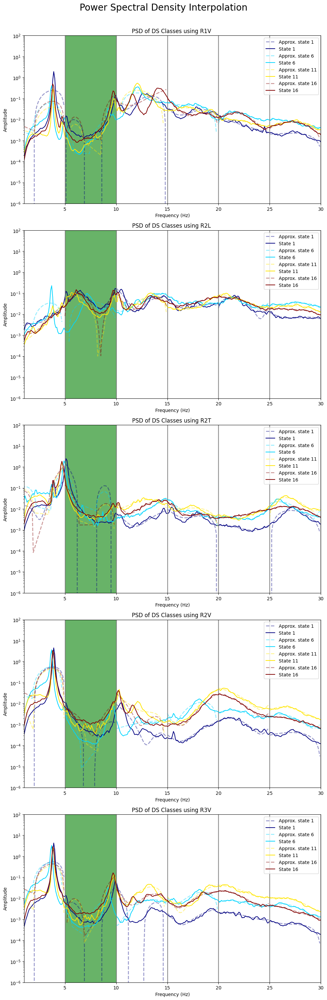

In [64]:
def plot_pwelch(dfs_preprocessed):
    fs = 100 #  the sample rate
    title = "Power Spectral Density Interpolation"

    fig, axes = plt.subplots(5, 1, figsize=(10, 6*5))
    fig.suptitle(title, fontsize=20, y = 1.006)

    # Loop through the subplots
    signals0 = [df.iloc[:, 0].values for df in dfs_preprocessed]
    for idx, ax in enumerate(axes):
        
        # The order is R1V, R2L, R2T, R2V, R3V
        signals = [df.iloc[:, idx].values for df in dfs_preprocessed]
        # signals = [signal[0:16384] for signal in signals] this was done to see how it would perform in the signal sample sizes we have in the training data

        # Plot 17 line plots on the current subplot
        for i in [0, 5, 10, 15]:

            # this should be constant for all signals around ~500,000
            n = len(signals[i])
            freqs,amplitude_spectrum = welch(signals[i], fs,nperseg= 1000) # nperseg = 1000 for training to prevent noise with smaller sample sizes
            #freqs0,amplitude_spectrum0 = welch(signals0[i], fs,nperseg= 3000)
    
            # cycle thru a colormap
            unique_color = plt.cm.jet(i / 15)

            # find the best fit polynomial degree visually
            window = 50
            for spline_idx_start in range(0, len(freqs), window):
                spline_idx_end = spline_idx_start + window
                x_vals = freqs[spline_idx_start:spline_idx_end]
                y_vals = amplitude_spectrum[spline_idx_start:spline_idx_end]
                coefficients = np.polyfit(x_vals, y_vals, deg=3)
                polynomial = np.poly1d(coefficients)
                y_fitted = polynomial(freqs[spline_idx_start:spline_idx_end])
                if spline_idx_start == 0:
                    sns.lineplot(x=freqs[spline_idx_start : spline_idx_end], y=y_fitted, label = f'Approx. state {i+1}',linestyle='--', color=unique_color, alpha = 0.4, linewidth=2, ax = ax)
                else:
                    sns.lineplot(x=freqs[spline_idx_start : spline_idx_end], y=y_fitted, linestyle='--', color=unique_color, alpha = 0.4, linewidth=2, ax = ax)

                if spline_idx_end < len(freqs):
                    ax.axvline(x=freqs[spline_idx_end], color='grey', linestyle='-', linewidth=1)

            print(len(freqs))
            ax.axvspan(freqs[50], freqs[100], color='green', alpha=0.2)
            # Plot the actual PSD/Transmissibility
            #print(len(spl.get_knots()))
            sns.lineplot(x=freqs, y=amplitude_spectrum, label=f'State {i+1}', color=unique_color, ax=ax)
            ax.set_xlabel('Frequency (Hz)')
            ax.set_ylabel('Amplitude')
            ax.set_title(f'PSD of DS Classes using {list_sensor_directions[idx]}')
            ax.legend(loc='upper right')
            ax.set_yscale("log") 
            ax.set_xlim(1,30) # TODO: change to 2.5, 6 and take snapshot of R2T for the final report. Also do likewise for the transmissibility
            ax.set_ylim(10e-7,100)
            #print(len(freqs))# 1501 for nperseg of 3000

    plt.tight_layout()
    plt.show()
plot_pwelch(dfs_preprocessed)

## Feature Extraction

In [66]:
# Takes 13 min
fs = 100
test_features = [get_features(el, fs) for el in test_data]
train_features = [get_features(el, fs) for el in train_data]

c:\Users\amroa\Documents\thesis\Chapter2-Z24-dataset\utils4.py:177: ComplexWarning: Casting complex values to real discards the imaginary part
  PSDd[:,k] = np.multiply(jbjf[0:NFFT//2+1], np.conj(jbjf[0:NFFT//2+1])  )


In [67]:
test_features_np = np.array(test_features)
train_features_np = np.array(train_features)
test_features_np.shape, train_features_np.shape

((68, 5, 49), (544, 5, 49))

In [68]:
# Save the array for precomputation
np.save("train_shape_544_5_49_new.npy", train_features_np)
np.save("test_shape_68_5_49_new.npy", test_features_np)

In [69]:
train_features_np = np.load("train_shape_544_5_49_new.npy")
test_features_np = np.load("test_shape_68_5_49_new.npy")

In [70]:
def transmissibility(data):
    def psd(signal):
        from scipy.signal import welch
        fs = 100
        f, Pxx_den = welch(signal, fs,nperseg= 1000)
        return Pxx_den[0:300] # since beyond 30 Hz we have noise 
    return np.array([np.array([psd(el[:,i])/psd(el[:,0]) for i in range(1,data.shape[2])]).flatten() for el in data])

In [71]:
trans_train = transmissibility(train_data)
trans_test = transmissibility(test_data)
trans_train.shape, trans_test.shape # we have 5 channels, but one of them is used as a reference so we have 4 channels since the psd with nperseg = 1000 is 501 and we have 4 non-ref channels, then we get shape 501*4 = 2004

((544, 1200), (68, 1200))

In [72]:
def power_spectral_density(data):
    def psd(signal):
        from scipy.signal import welch
        fs = 100
        f, Pxx_den = welch(signal, fs,nperseg= 1000)
        #print(np.where(f >= 30)[0][0]) # 300
        return Pxx_den[0:300] # 300 is the index where frequency corresponds to 30 Hz
    return np.array([ np.array([  psd(el[:,i]) for i in range(data.shape[2]) ]).flatten() for el in data])

psd_train = power_spectral_density(train_data)
psd_test = power_spectral_density(test_data)
psd_train.shape, psd_test.shape

((544, 1500), (68, 1500))

In [73]:
def frequency_domain_features(signal): # signal is a row of psd_train or trans_train
    def segment(arr, n):
        """
        Divides the array into n equal parts and returns two arrays:
        - An array with the maximum value in each part.
        - An array with the percentage denoting the relative position of the maximum value in its segment.
        """
        arr = np.array(arr)
        segment_length = len(arr) // n
        max_values = np.max(arr.reshape(-1, segment_length), axis=1)
        
        # Get the indices of the max values in their respective segments
        max_indices = np.argmax(arr.reshape(-1, segment_length), axis=1) + 1
        
        # Calculate relative positions as percentages
        relative_positions = (max_indices / segment_length) * 100

        return max_values, relative_positions

    def piecewise_regression(signal):
         # find the best fit polynomial degree visually
        window = 50
        coeff_array = []
        for idx, spline_idx_start in enumerate(range(0, 300, window)):
            spline_idx_end = spline_idx_start + window
            x_vals = np.linspace(idx*5, 4.9 + idx*5 , 50) # found by inspecting freqs 
            y_vals = signal[spline_idx_start:spline_idx_end]
            coefficients = np.polyfit(x_vals, y_vals, deg=3)
            coeff_array.append(coefficients)
        return np.array(coeff_array).flatten()
        
    # spectral centroid over part/window of the signal (there are four parts in the signal)
    def spectral_centroid(signal_window, freq_range):
        n = len(signal_window)
        return np.sum(freq_range * signal_window) / np.sum(signal_window) # frequencies weighted by their amplitude
    
    # spectral centroid window length
    window_size = len(signal)//4
    spectral_windows = range(0, len(signal), window_size) # (0, 75) (75, 150) (150, 225) (225, 300)
    spectral_centroids = [ spectral_centroid(signal[i:i + window_size], np.linspace(i*7.5, (i+1)*7.5, 75)) for i in spectral_windows] # 4 coefficients as there are 4 windows described in the line above

    # overall amplitude
    amp = np.mean(signal)

    nbr_peaks = ftc.number_peaks(signal, 25) # bigger than its 25 neighbors to the left and the right
    peaks, properties = find_peaks(signal, distance = 25) # not feature
    prominences = peak_prominences(signal, peaks)[0] # not a feature
    sorted_peak_indices = np.argsort(prominences)[-4:]

    sharpest_peaks_positions = peaks[sorted_peak_indices] # value of the signal at the sharpest 4 (most prominent) peaks
    sharpest_peak_heights = signal[sharpest_peaks_positions]

    # statistical characteristics of peak indices
    std_peaks = np.std(peaks)
    mean_peaks = np.mean(peaks)
    kur_peaks = kurtosis(peaks)
    skew_peaks = skew(peaks)

    heights = signal[peaks] # not a feature

    # we fit degree 5 b/c there were 4 main peaks observed in the signal. The frequency range is 1 to 30 Hz, however the length of the PSD is 300 (see cell with signature of power_spectral_..) 
    coeffs = piecewise_regression(signal) #np.polyfit(np.linspace(1, 30, 300), signal, 5)  

    mean_prom = np.mean(prominences)
    std_prom = np.std(prominences)
    mean_height = np.mean(heights)
    std_height = np.std(heights) 

    # segment the signal and find the maximum values in each segment along with the relative position of the maximum in the segment
    # we divide the [1,30] Hz window into intervals of size 2.5 Hz, which corresponds to windowlength 25 in the psd signal of size 300  (Note: 300/25 = 30/2.5 = 12)
    max_vals, rel_pos = segment(signal, 12)

    # 52 features
    return np.concatenate(([amp, nbr_peaks, std_peaks, mean_peaks, kur_peaks, skew_peaks, mean_prom, std_prom, mean_height, std_height], coeffs, sorted_peak_indices, sharpest_peaks_positions, sharpest_peak_heights, max_vals, rel_pos, spectral_centroids))


In [74]:
def psd_trans_properties(data):
    iterations = int(data.shape[1]/300) # should be 5 for both training and test (for psd)
    return np.hstack([np.apply_along_axis(frequency_domain_features, axis=1, arr=data[:, int(i*300) : int((i+1)*300) ]) for i in range(iterations)])

# get the properties of the PSD
train_psd_properties = psd_trans_properties(psd_train)
test_psd_properties = psd_trans_properties(psd_test)

# get the properties of the transmissibility
train_trans_properties = psd_trans_properties(trans_train)
test_trans_properties = psd_trans_properties(trans_test)

train_psd_properties.shape, test_psd_properties.shape, train_trans_properties.shape, test_trans_properties.shape

((544, 370), (68, 370), (544, 296), (68, 296))

In [49]:
#train_features_np = np.load("train_shape_544_5_49.npy")
#test_features_np  = np.load("test_shape_68_5_49.npy")

In [75]:
# the raw signal features flattened from (544, 5, 49) to (544, 245) for the sack of hstack with the PSD and transmissibility features
train_features_flat = np.array([el.flatten() for el in train_features_np])
test_features_flat = np.array([el.flatten() for el in test_features_np])

# first 245 are the (bandpass filtered, detrended) signal properties, the next 370 properties are those of the PSD, the last 296 are those of the transmissiblity. In summary [0:240] are signal props, [240:610] are PSD, and [610:906] are transmissibility
X_train_unprocessed = np.hstack((train_features_flat, train_psd_properties, train_trans_properties)) 
X_test_unprocessed = np.hstack((test_features_flat, test_psd_properties, test_trans_properties)) 

In [76]:
X_train_unprocessed.shape

(544, 911)

## Data preprocessing

In [77]:
def data_preprocessing(data, valid_columns = None, imputer = None, scaler = None): # for training data, default is None. For test, other parameters should be passed
    from sklearn.impute import SimpleImputer
    from sklearn.preprocessing import StandardScaler
    X_flattened_unstd = data
    X_valid_cols = []
    X_imputed = []
    X_std = []

    ## Remove columns with too many NANs
    if valid_columns is None:
        # Create a boolean mask for NaN values
        nan_mask = np.isnan(X_flattened_unstd)

        # Check for NaN values in each column and print the column indices with NaN values
        columns_with_nan = np.any(nan_mask, axis=0)
        nan_columns_indices = np.where(columns_with_nan)[0]

        nan_per_column = [np.sum(np.isnan(X_flattened_unstd[:, el])) if el in nan_columns_indices else 0 for el in range(X_flattened_unstd.shape[1])]
        valid_columns = np.array(nan_per_column) < (0.1*(X_flattened_unstd.shape[0])) # if more than 10 percent of a column is NaN, we ignore it 
        print(np.sum(valid_columns)) # we will sadly let go of 5 columns

        X_valid_cols = X_flattened_unstd[:, valid_columns]
    else:
        X_valid_cols = X_flattened_unstd[:, valid_columns]

    ## Impute missing values
    if imputer is None:
        imputer = SimpleImputer(strategy='mean')
        X_imputed = imputer.fit_transform(X_valid_cols)
    else:
        X_imputed = imputer.transform(X_valid_cols)

    ## Standardize the data
    if scaler is None:
        scaler = StandardScaler()
        X_std = scaler.fit_transform(X_imputed)
    else:
        X_std = scaler.transform(X_imputed)

    return X_std, valid_columns, imputer, scaler

In [78]:
X_train, valid_columns, imputer, scaler = data_preprocessing(X_train_unprocessed)
X_test, _, _, _ =                         data_preprocessing(X_test_unprocessed, valid_columns = valid_columns, imputer = imputer, scaler = scaler)
invalid_cols = set(np.arange(0, 875).astype(int)) - set(np.where(valid_columns)[0]) 
X_train.shape, X_test.shape, list(invalid_cols)

906


((544, 906), (68, 906), [66, 164, 17, 115, 213])

## PCA

In [126]:
def pca_plot_binary(indices, title):
    import matplotlib.colors as mcolors
    pca = PCA(n_components=2, svd_solver='auto') 
    X_train_2D = pca.fit_transform(X_train[:, indices])
    cmap = mcolors.ListedColormap(['blue', 'red'])

    # Size of the plot
    plt.figure(figsize=(10, 8))

    # PCA scatter plot
    sc = plt.scatter(X_train_2D[:, 0], X_train_2D[:, 1], c=binarize(labels_train), cmap=cmap)
    plt.title(title)
    plt.xlabel("PC 1")
    plt.ylabel("PC 2")
    plt.xlim(-5, 5)
    plt.ylim(-5, 5)

    # Display the plot
    plt.show()

In [127]:
def pca_plot(indices, title):
    pca = PCA(n_components=2, svd_solver='auto') 
    X_train_2D = pca.fit_transform(X_train[:, indices])

    # Size of the plot
    plt.figure(figsize=(10, 8))

    # PCA scatter plot
    sc = plt.scatter(X_train_2D[:, 0], X_train_2D[:, 1], c=labels_train, cmap='viridis')
    plt.title(title)
    plt.xlabel("PC 1")
    plt.ylabel("PC 2")
    plt.xlim(-5, 5)
    plt.ylim(-5, 5)

    # Add colorbar
    cbar = plt.colorbar(sc)
    cbar.set_label('Labels')

    # Display the plot
    plt.show()

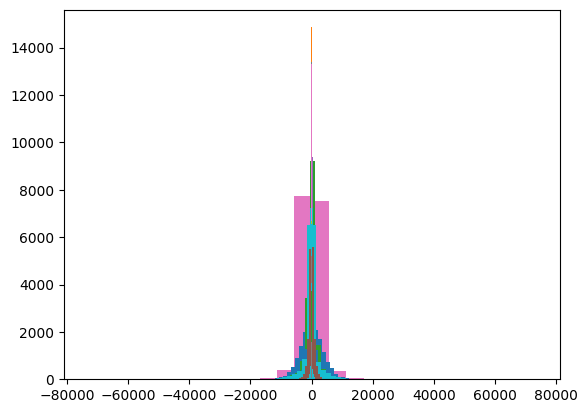

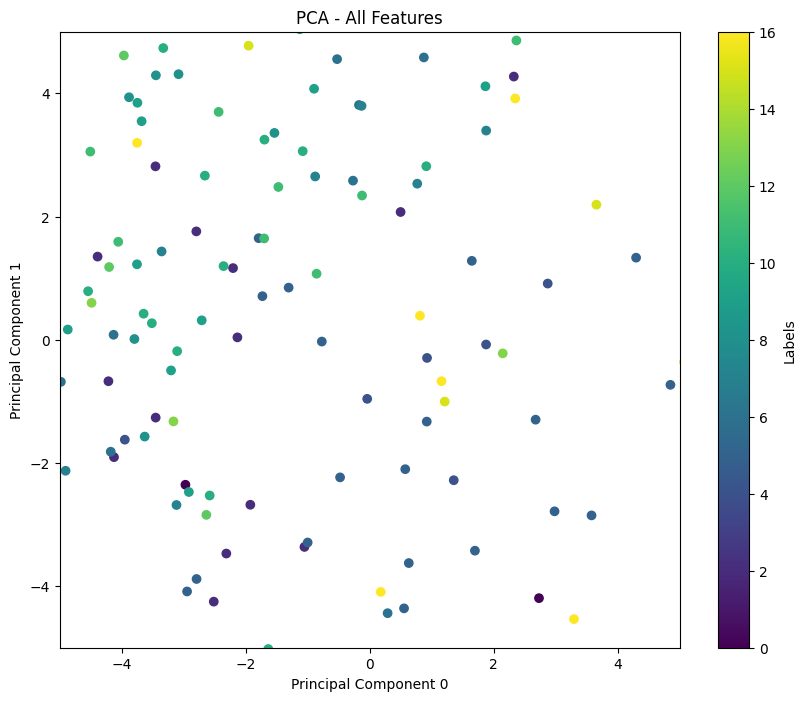

In [80]:
pca_plot(np.arange(X_train.shape[1]), "PCA - All Features")

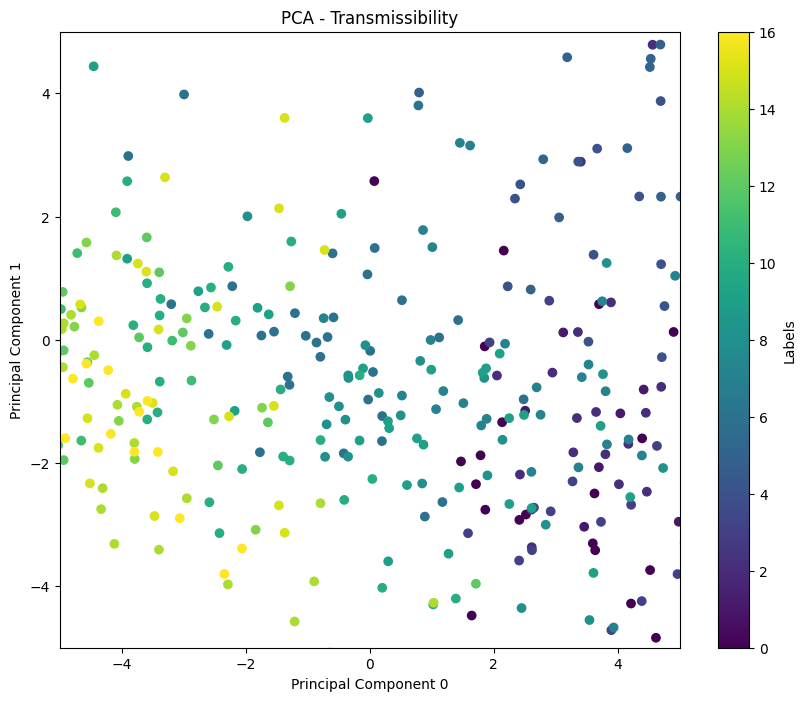

In [81]:
pca_plot(np.arange(610, X_train.shape[1]), "PCA - Transmissibility")

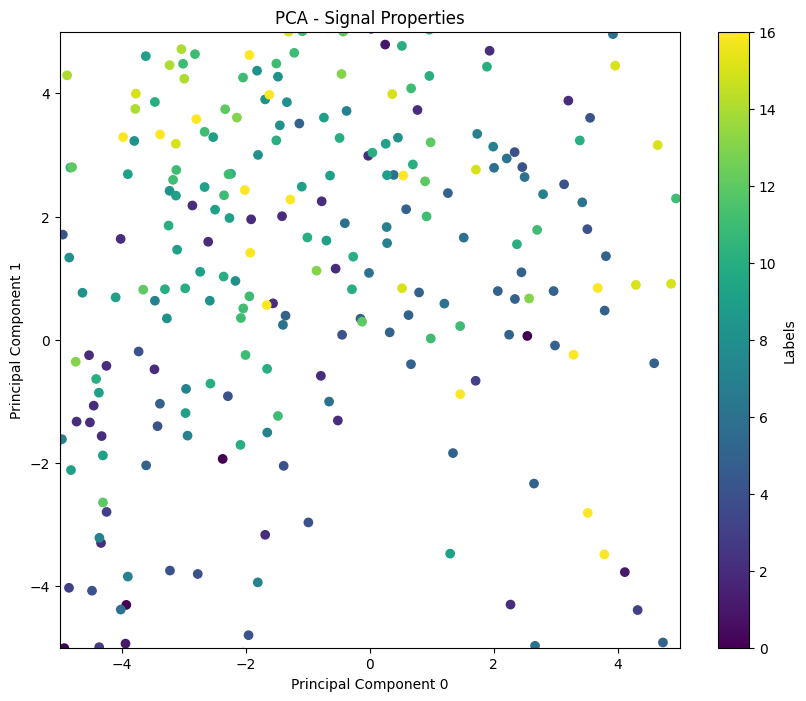

In [82]:
pca_plot(np.arange(0, 240), "PCA - Signal Properties")

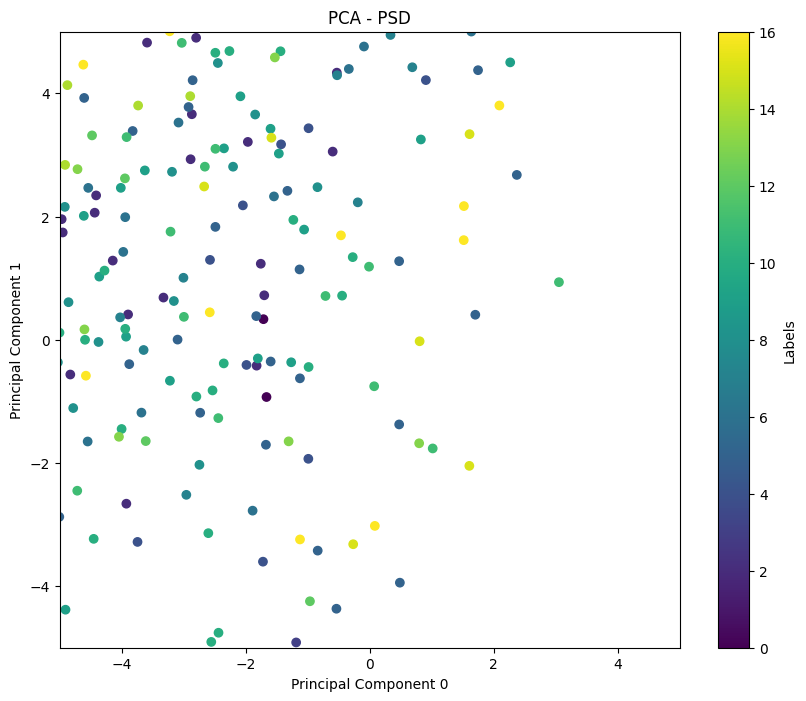

In [83]:
pca_plot(np.arange(240, 610), "PCA - PSD")

## t-SNE

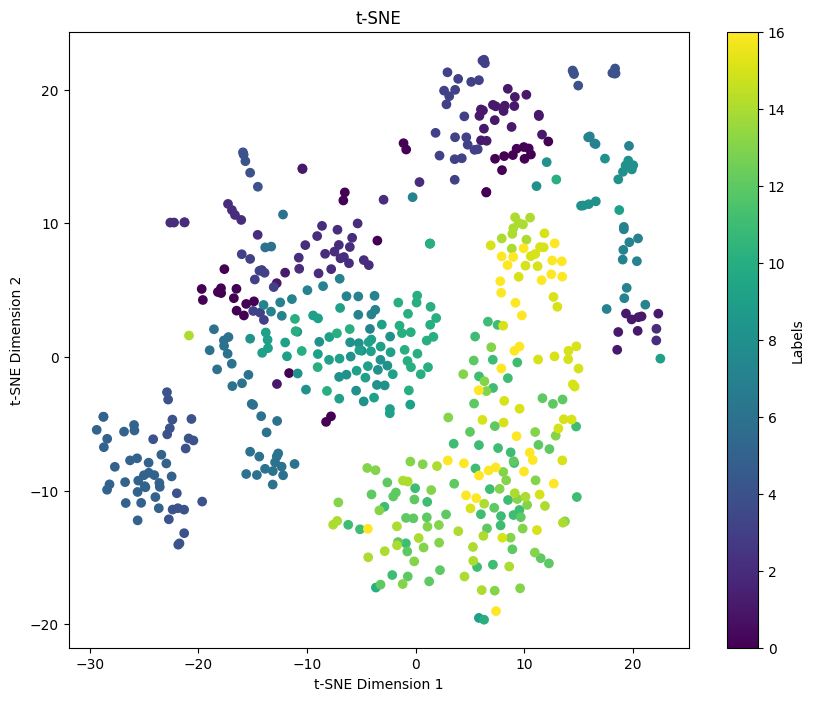

In [86]:
tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(X_train)

# create figure and axes object
fig, ax1 = plt.subplots(figsize=(10, 8))

# scatter plot for PCA
sc = ax1.scatter(tsne_results[:, 0], tsne_results[:, 1], c=labels_train, cmap='viridis')
ax1.set_title("t-SNE")
ax1.set_xlabel("t-SNE Dimension 1")
ax1.set_ylabel("t-SNE Dimension 2")
cbar = plt.colorbar(sc, ax=ax1)
cbar.set_label('Labels')

# display the plot
plt.show()

In [88]:
# save all training and test data
np.save("X_test_new.npy", X_test)
np.save("X_train_new.npy", X_train)
np.save("labels_test_new.npy", labels_test)
np.save("labels_train_new.npy", labels_train)

In [10]:
X_train = np.load("X_train_new.npy")
labels_train = np.load("labels_train_new.npy")
X_test = np.load("X_test_new.npy")
labels_test = np.load("labels_test_new.npy")

## Feature selection

In [17]:
def flatten(lst): # to flatten lists of lists
    result = []
    for item in lst:
        if isinstance(item, list):
            result.extend(flatten(item))
        else:
            result.append(item)
    return result

In [19]:
## get an array containing all the feature names. Size is 906
list_sensor_directions = ['R1V ', 'R2L ', 'R2T ', 'R2V ', 'R3V ']
utils_time = ["d_mean", "d_median", "d_mode", "d_std", "d_var", "d_skew", "d_kurt", "d_cov", "d_zeros", "d_nans", "f_lsam", "f_lsbm", 
                         "f_n_peaks", "f_srv", "f_count0", "f_nu", "f_nu2", "f_ac_part", "f_bc", "f_c3", "f_cid_ce", "f_sl", "f_fulch", "f_rms", 
                         "f_abs_en", "f_abs_sc", "f_abs_mc", "f_mc", "f_m2d", "f_vlstd", "f_lstd", "f_rbs", "var_std_dist", "var_mta_dist", "var_lta_dist", 
                         "homog_sta_dist", "homog_mta_dist", "homog_lta_dist"] 
utils_acc = ["entr1", "entr2", "kurt_psd", "kurt_fft", "homog_psd", "homog_fft", "psd_range_95", "psd_range_50", 
                        "fft_range_95", "fft_range_50"] # length 48 for feature
utils = utils_time + utils_acc

# 48*5 channels = 240 features from this
coeff_array = [f"coeff_{i}" for i in range(24)] # interpolation coefficients 
rel_pos_array = [f"rel_pos_{i}" for i in range(12)]

psd_or_tran_features = ["amp", "nbr_peaks", "std_peaks", "mean_peaks", "kur_peaks", "skew_peaks", "mean_prom", "std_prom", "mean_height", "std_height", coeff_array, 
                ["sorted_peak_indices"]*4, ["sharpest_peaks_positions"]*4, ["sharpest_peak_heights"]*4, ["max_vals"]*12, rel_pos_array, 4*["spectral_centroids"]]
psd_or_tran_features = flatten(psd_or_tran_features)

# add channel specific information
feature_labels = flatten([[ft_name + "_"+ channel_name for ft_name in utils] for channel_name in list_sensor_directions])

for prop in ["psd", "trans"]:
    for idx, el_channel in enumerate(list_sensor_directions):
        if prop == "trans" and idx == 0:
            continue
        inter_ans = [ft_name + "_" + prop + "_" + el_channel for ft_name in psd_or_tran_features]
        feature_labels = feature_labels + inter_ans

(len(utils), len(utils_time), len(utils_acc), len(psd_or_tran_features)), (len(utils)*5 + 9*len(psd_or_tran_features)), len(feature_labels)

((48, 38, 10, 74), 906, 906)

In [15]:
# to plot feature importances using bar plot
def plot_ranking(sorted_feature_indices, feature_importances, feature_labels, top_k, model, size):
    import matplotlib.patches as mpatches

    # Ranges for the features
    acc_range       = np.array([np.arange(0, 38).astype('int') + i*48 for i in range(5)]).flatten() # acc from utils
    psd_range_utils = np.array([np.array([38, 39, 40, 42, 44, 45])+ i*48 for i in range(5)]).flatten() # psd from utils
    fft_range_utils = np.array([np.array([41, 43, 46, 47])        + i*48 for i in range(5)]).flatten() # fft from utils
    
    psd_range = np.arange(240, 610).astype('int') 
    trans_range = np.arange(610, 906).astype('int')

    top_indices = sorted_feature_indices[:top_k]
    top_importances = feature_importances[top_indices]
    top_labels = np.array(feature_labels)[top_indices]
    fig, ax = plt.subplots(figsize=size) # [10, 20]
    
    colors = [(1, 0.8, 0.8) if i in acc_range else (0.8, 0.8, 1) if i in trans_range else (0.8, 1, 0.8) if i in fft_range_utils else (0.819, 0.58, 0.58) for i in top_indices]
    ax.barh(range(top_k), top_importances, align='center', color = colors)
    
    # Set the y-ticks to be the feature labels
    ax.set_yticks(range(top_k))
    ax.set_yticklabels(top_labels)

    # Invert the y-axis to have the most important feature at the top
    ax.legend()
    ax.invert_yaxis()

    legend_handles = [mpatches.Patch(color=(1, 0.8, 0.8), label='Acceleration'),
                      mpatches.Patch(color=(0.8, 0.8, 1), label='Transmittance'),
                      mpatches.Patch(color=(0.8, 1, 0.8), label='FFT'),
                       mpatches.Patch(color=(0.819, 0.58, 0.58), label='PSD') ]
    #ax.legend(handles=legend_handles)
    ax.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1.0), loc='upper left')


    ax.set_xlabel('Feature Importance')
    ax.set_title(f'Top {top_k} Important Features for {model}')

    plt.show()

### XGBoost-based feature selection

### XGBoost - Binary Classification

In [92]:
# this time we do binary classification
param_grid = {
            'learning_rate': [0.05, 0.1, 1],
            'max_depth': [3, 5, 7],
            'min_child_weight': [1, 3, 5],
            'gamma': [0.1, 0.5, 1],
            'subsample': [0.4, 0.7, 1],
            'colsample_bytree': [0.3, 0.4, 0.5],
            'n_estimators': [35, 70, 100, 140]
        }

In [93]:
y = binarize(labels_train)
grid_search_xg_bin = GridSearchCV(XGBClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search_xg_bin.fit(X_train, y)
print(f"For feature selection the score on full dataset is {grid_search_xg_bin.best_score_} and optimal params are {grid_search_xg_bin.best_params_}")

For feature selection the score on full dataset is 0.9006455997281687 and optimal params are {'colsample_bytree': 0.4, 'gamma': 0.1, 'learning_rate': 1, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 35, 'subsample': 1}


In [12]:
# Sort feature indices based on importance (using the optimal hyperparameters found in the last cell)
xgb_bin_model = XGBClassifier(learning_rate = 1, max_depth = 2, gamma = 0.1, subsample = 1, colsample_bytree = 0.4, n_estimators=35)
xgb_bin_model.fit(X_train, binarize(labels_train))
sorted_feature_indices = np.argsort(xgb_bin_model.feature_importances_)[::-1]
y = binarize(labels_train)

In [122]:
feature_count = [4, 8, 16, 32, 64, 128]
scores_prog_xg_bin = []
for cnt in feature_count:
    subset_indices = sorted_feature_indices[:cnt]
    grid_search_xg_bin = GridSearchCV(XGBClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
    grid_search_xg_bin.fit(X_train[:, subset_indices], y)

    # Append current score to progression list
    scores_prog_xg_bin.append(grid_search_xg_bin.best_score_)
    print(f"For feature selection the score on {cnt} columns is {grid_search_xg_bin.best_score_} and optimal params are {grid_search_xg_bin.best_params_}")

For feature selection the score on 4 columns is 0.95587835541964 and optimal params are {'colsample_bytree': 0.5, 'gamma': 1, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 70, 'subsample': 0.7}
For feature selection the score on 8 columns is 0.9410125722052328 and optimal params are {'colsample_bytree': 0.3, 'gamma': 0.1, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 35, 'subsample': 1}
For feature selection the score on 16 columns is 0.9466700645599728 and optimal params are {'colsample_bytree': 0.5, 'gamma': 0.1, 'learning_rate': 1, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.7}
For feature selection the score on 32 columns is 0.9539925246347265 and optimal params are {'colsample_bytree': 0.3, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 140, 'subsample': 0.4}
For feature selection the score on 64 columns is 0.924549779136935 and optimal params 

In [123]:
list(zip(feature_count, scores_prog_xg_bin))

[(4, 0.95587835541964),
 (8, 0.9410125722052328),
 (16, 0.9466700645599728),
 (32, 0.9539925246347265),
 (64, 0.924549779136935),
 (128, 0.9337240910635407)]

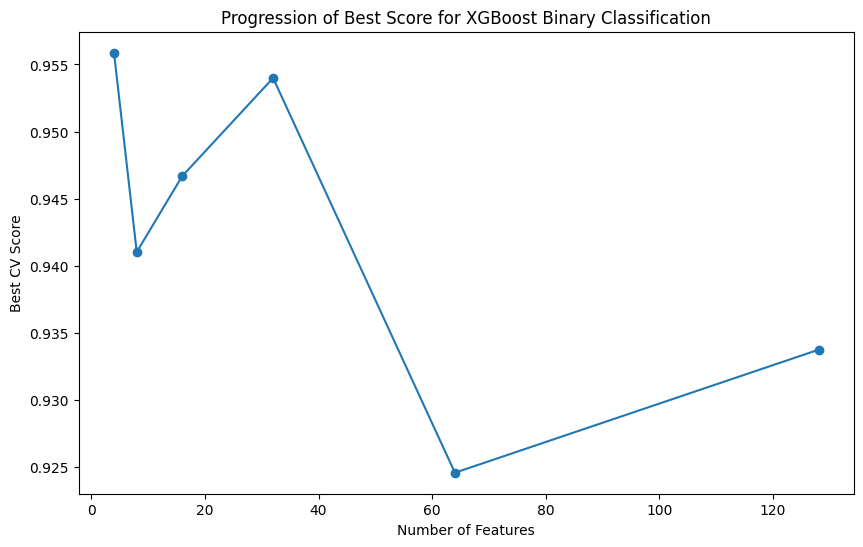

In [124]:
# Plotting
plt.figure(figsize=(10,6))
plt.plot(feature_count, scores_prog_xg_bin, '-o')
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for XGBoost Binary Classification')
plt.show()

In [21]:
sorted_feature_indices[0:100]

array([673, 691, 191, 670, 780, 515, 429, 886, 485, 754, 303, 325, 150,
       326, 693, 703, 477, 473, 575, 805, 883, 781, 199, 190, 414,  58,
       700, 345, 390, 374, 767, 604, 893, 175, 203, 758, 510, 302, 373,
       811, 732, 219, 294, 283, 282, 293, 286, 284, 292, 289, 287, 291,
       290, 285, 288, 316, 295, 296, 315, 314, 313, 312, 311, 310, 309,
       308, 307, 306, 305, 304, 317, 281, 301, 299, 298, 318, 297, 300,
       273, 280, 253, 251, 250, 249, 248, 247, 246, 245, 244, 243, 242,
       241, 240, 239, 238, 237, 236, 235, 234, 233], dtype=int64)

In [25]:
# Test accuracy
subset_indices = sorted_feature_indices[:4]
best_pars = {'colsample_bytree': 0.5, 'gamma': 1, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 70, 'subsample': 0.7}
xgb_bin = XGBClassifier(**best_pars)
xgb_bin.fit(X_train[:, subset_indices], y)
np.sum(xgb_bin.predict(X_test[:, subset_indices]) == binarize(labels_test))/len(labels_test)

0.9411764705882353

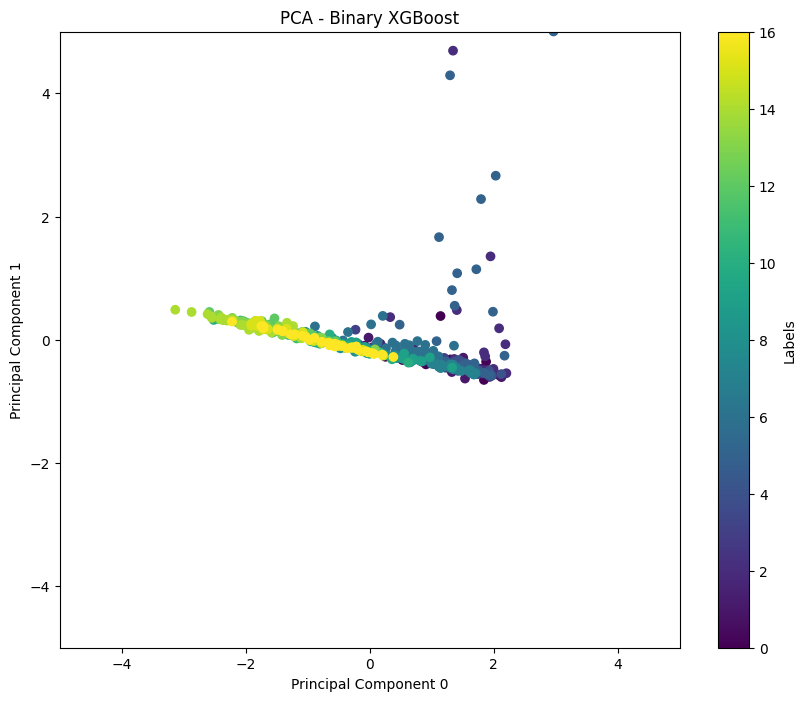

In [121]:
pca_plot(np.array([673, 691, 191, 670]), "PCA - Binary XGBoost")

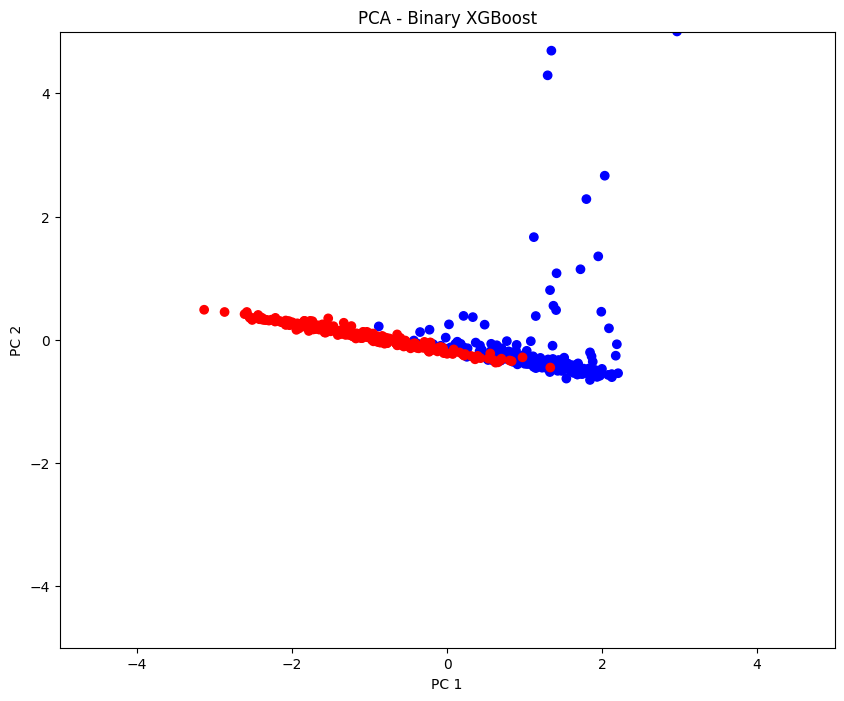

In [128]:
pca_plot_binary(np.array([673, 691, 191, 670]), "PCA - Binary XGBoost")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


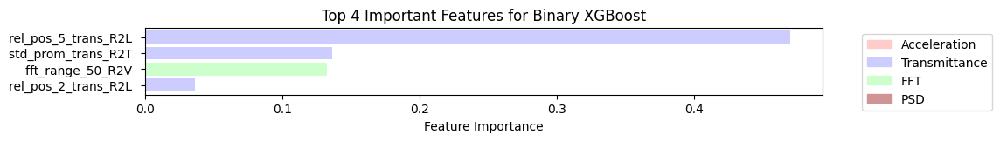

In [20]:
sorted_feature_indices = np.argsort(xgb_bin_model.feature_importances_)[::-1]
plot_ranking(sorted_feature_indices, xgb_bin_model.feature_importances_, feature_labels, 4, 'Binary XGBoost', [10, 1]) # 80 is where the elbow is located

### SVC -  Binary Classification

In [112]:
# Logistic regression depends on the statistical distribution of the data, rather than the geometry like SVC, making it a better candidate for feature importance rather than SVC
# C = 0.2 was determined experimentally below to be the optimal regularization coefficient
param_grid = {'C': [0.1, 0.2, 0.4], 'penalty': ['l1'], 'solver': ['liblinear'] }
y = binarize(labels_train)
log_reg_grid = GridSearchCV(LogisticRegression(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
log_reg_grid.fit(X_train, y)
print(log_reg_grid.best_params_)
log_reg = LogisticRegression(**log_reg_grid.best_params_)
log_reg.fit(X_train, y)
sorted_feature_indices = np.argsort(np.abs(log_reg.coef_[0]))[::-1] # get the indices of the most important features in descending order

{'C': 0.2, 'penalty': 'l1', 'solver': 'liblinear'}


In [113]:
# Find the accuracy using this number of features
feature_counts = [4, 8, 16, 32, 64, 128]
scores_prog_svc_bin = []

# Hyperparameters to tune for SVC
param_grid = {
        'C': [0.1, 0.5, 1, 2],
        'gamma': ['auto', 'scale'],
        'kernel': ['linear', 'rbf'] # linear due to the number of features
    }

for idx, feature_count in enumerate(feature_counts):
    subset_indices = sorted_feature_indices[:feature_count] # subset of columns to use from the training data
    # List to store progression of scores
    grid_search = GridSearchCV(SVC(random_state = 20), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
    grid_search.fit(X_train[:, subset_indices], y)
    scores_prog_svc_bin.append(grid_search.best_score_)
    print(f"For feature count {feature_count} and run {idx} the score is {grid_search.best_score_} and param is {grid_search.best_params_}")

For feature count 4 and run 0 the score is 0.931923207611281 and param is {'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
For feature count 8 and run 1 the score is 0.946721032959565 and param is {'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}
For feature count 16 and run 2 the score is 0.9576622494053687 and param is {'C': 2, 'gamma': 'auto', 'kernel': 'linear'}
For feature count 32 and run 3 the score is 0.9779306829765545 and param is {'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
For feature count 64 and run 4 the score is 0.9852701325178389 and param is {'C': 0.5, 'gamma': 'auto', 'kernel': 'linear'}
For feature count 128 and run 5 the score is 0.9705232755691471 and param is {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}


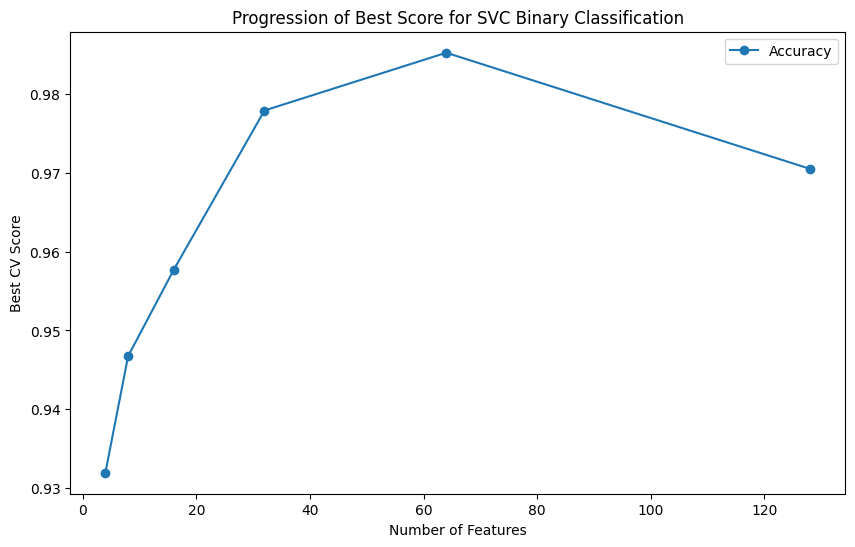

In [114]:
plt.figure(figsize=(10,6))
plt.plot(feature_counts, scores_prog_svc_bin, '-o', label='Accuracy')
#plt.fill_between(feature_counts, mean_scores - std_scores, mean_scores + std_scores, color='gray', alpha=0.2, label='1 Standard Deviation') # svc is deterministic
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for SVC Binary Classification')
plt.legend()
plt.show()

In [115]:
list(zip(feature_counts, scores_prog_svc_bin))

[(4, 0.931923207611281),
 (8, 0.946721032959565),
 (16, 0.9576622494053687),
 (32, 0.9779306829765545),
 (64, 0.9852701325178389),
 (128, 0.9705232755691471)]

In [116]:
# The most important damage sensitive features
sorted_feature_indices[0:100]

array([732, 670, 239, 191, 731, 303, 448, 673, 905, 758, 374, 608, 811,
       812, 442, 307, 819, 676, 888, 257, 329, 256,  36, 255, 899, 415,
       601, 375, 189, 341, 373, 328, 738,  37, 805, 342, 895, 347, 734,
       747, 414, 343, 571, 594,  34, 833,  11, 528, 296,  59, 226, 463,
       405, 416, 292, 293, 294, 287, 295, 288, 291, 289, 290, 286,   7,
       297, 310, 319, 318, 317, 316, 315, 314, 313, 312, 311, 309, 298,
       308, 306, 305, 304,   2, 302, 301, 300, 299, 285, 277, 284, 283,
       253, 252, 251, 250, 249, 248, 247, 246, 245], dtype=int64)

In [117]:
svcbin = SVC(**{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'})
svcbin.fit(X_train[:, sorted_feature_indices[:32]], y)
np.sum(svcbin.predict(X_test[:, sorted_feature_indices[:32]]) == binarize(labels_test))/len(labels_test)

0.9558823529411765

#### > The optimal number of features for binary SVC is 32 and binary XGBoost is 4 

In [123]:
svc_feat_indices = [732, 670, 239, 191, 731, 303, 448, 673, 905, 758, 374, 608, 811,
       812, 442, 307, 819, 676, 888, 257, 329, 256,  36, 255, 899, 415,
       601, 375, 189, 341, 373, 328, 738,  37, 805, 342, 895, 347, 734,
       747, 414, 343, 571, 594,  34, 833,  11, 528, 296,  59, 226, 463,
       405, 416, 292, 293, 294, 287, 295, 288, 291, 289, 290, 286,   7,
       297, 310, 319, 318, 317, 316, 315, 314, 313]

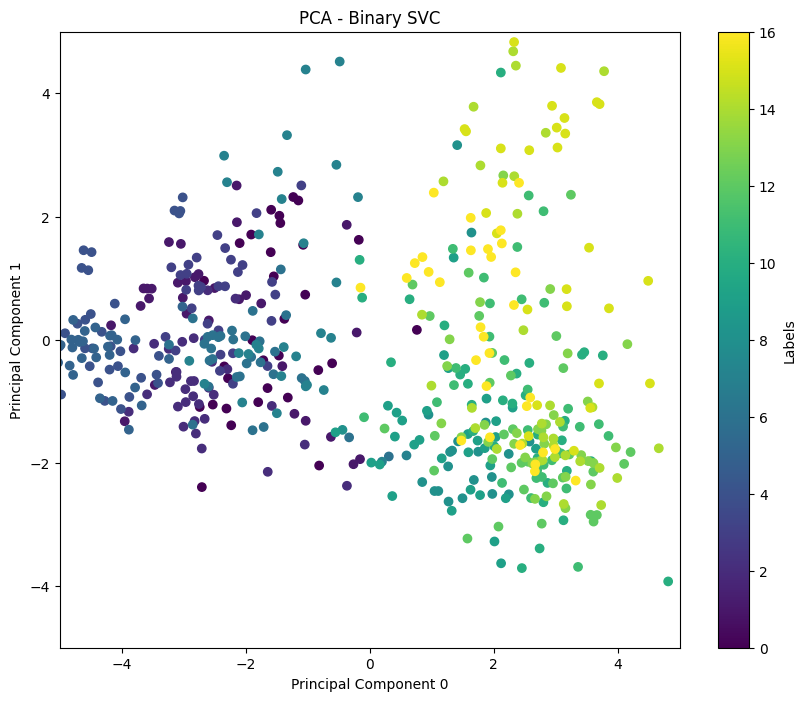

In [118]:
pca_plot(sorted_feature_indices[:32], "PCA - Binary SVC")

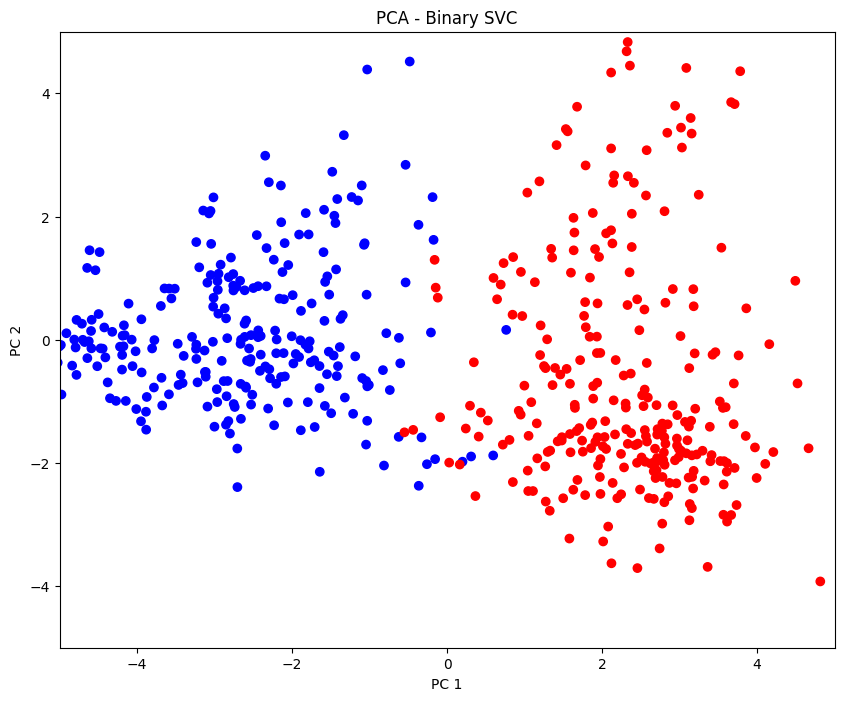

In [129]:
pca_plot_binary(svc_feat_indices[:32], "PCA - Binary SVC")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


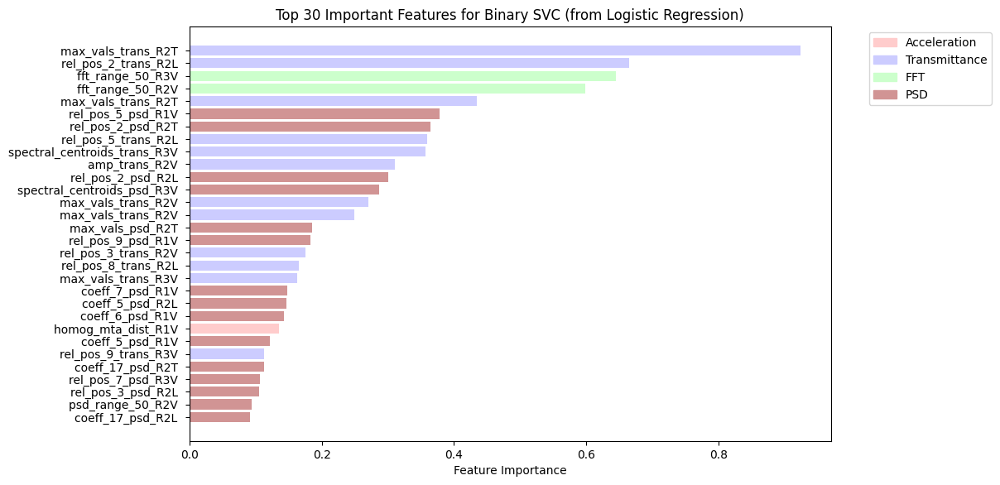

In [119]:
plot_ranking(sorted_feature_indices, np.abs(log_reg.coef_[0]), feature_labels, 30, 'Binary SVC (from Logistic Regression)', [10, 6.5]) # 80 is where the elbow is located

### KNN - Binary Classification

In [165]:
features_to_keep = [4, 8, 16, 32, 64, 128]
neighbors = [2, 4, 8, 16]
scores_prog_knn_bin = [0]*len(features_to_keep)
weights = None
y = binarize(labels_train)
max_score = -1

In [166]:
for pca_count in [3, 6, 12]:
    for neighbor_count in neighbors:
        for idx, feat_cnt in enumerate(features_to_keep):

            if feat_cnt < pca_count: # if the features to keep from pca are more than features from relief, SKIP
                continue

            # feature selection
            fs = ReliefF(n_neighbors=neighbor_count, n_features_to_select=feat_cnt)
            fs.fit(X_train, y)
            X_train_relief = fs.transform(X_train)

            # dimensionality reduction (to stabilize KNN and avoid dimensionality curse)
            pca = PCA(n_components=pca_count, svd_solver = 'auto') 
            X_train_pca = pca.fit_transform(X_train_relief)

            # hyperparameters to tune
            param_grid = {
                'n_neighbors': [5, 10, 20, 40],
                'p': [1, 2] # 1 = manhattan, 2 = euclidean
            }

            grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, n_jobs=-1, scoring='accuracy')
            grid_search.fit(X_train_pca, y)

            scores_prog_knn_bin[idx] = max(scores_prog_knn_bin[idx], grid_search.best_score_)
            if grid_search_xg_bin.best_score_ > max_score:
                weights = fs.feature_importances_
                optimal_config = (pca_count, feat_cnt)
                max_score = grid_search_xg_bin.best_score_
                
            print(f"For feature count {feat_cnt} and pca {pca_count} and neighbor count {neighbor_count} the score is {grid_search.best_score_} and param is {grid_search.best_params_}") # optimal is 20, 7, and 16

For feature count 4 and pca 3 and neighbor count 2 the score is 0.8201664967720014 and param is {'n_neighbors': 40, 'p': 2}
For feature count 8 and pca 3 and neighbor count 2 the score is 0.9247366632687735 and param is {'n_neighbors': 40, 'p': 2}
For feature count 16 and pca 3 and neighbor count 2 the score is 0.9430682976554536 and param is {'n_neighbors': 40, 'p': 2}
For feature count 32 and pca 3 and neighbor count 2 the score is 0.9118246687054027 and param is {'n_neighbors': 40, 'p': 2}
For feature count 64 and pca 3 and neighbor count 2 the score is 0.8585287121984371 and param is {'n_neighbors': 10, 'p': 2}
For feature count 128 and pca 3 and neighbor count 2 the score is 0.8933061501868842 and param is {'n_neighbors': 40, 'p': 2}
For feature count 4 and pca 3 and neighbor count 4 the score is 0.8201664967720014 and param is {'n_neighbors': 40, 'p': 2}
For feature count 8 and pca 3 and neighbor count 4 the score is 0.9247366632687735 and param is {'n_neighbors': 40, 'p': 1}
For

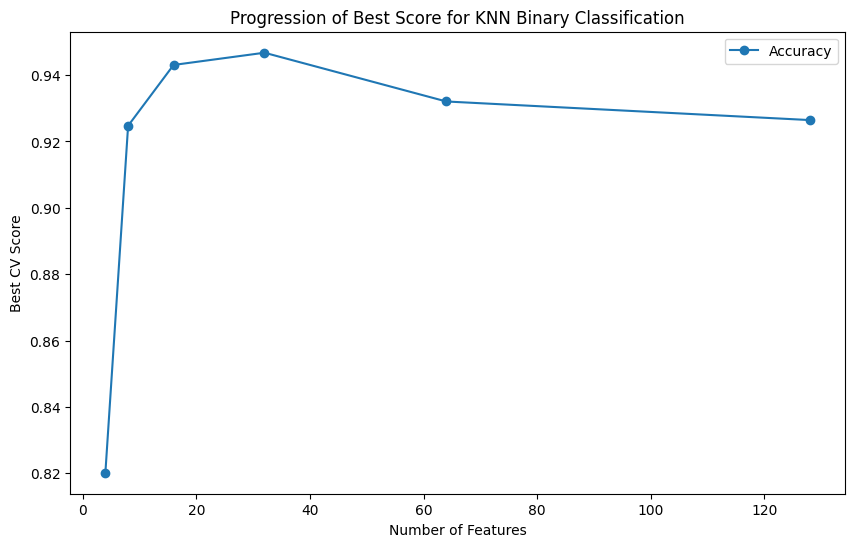

In [167]:
plt.figure(figsize=(10,6))
plt.plot(features_to_keep, scores_prog_knn_bin, '-o', label='Accuracy')
plt.xlabel('Number of Features')
plt.ylabel('Best CV Score')
plt.title('Progression of Best Score for KNN Binary Classification') # the peak occurred at 200 with 83% accuracy, but for the sake of methodolody we will keep this graph wihtout a notch at 200 to remain consistent with the other graphs 
plt.legend()
plt.show()

In [168]:
list(zip(features_to_keep, scores_prog_knn_bin))

[(4, 0.8201664967720014),
 (8, 0.9247366632687735),
 (16, 0.9430682976554536),
 (32, 0.9467550118926267),
 (64, 0.9320591233435269),
 (128, 0.9264525993883794)]

In [169]:
np.argsort(weights)[::-1][0:300]

array([303, 821, 747, 673, 191, 732, 189, 373, 895, 374, 582, 447, 670,
       731, 508, 701, 700, 699, 698, 756, 239, 683, 682, 608, 830, 237,
       758, 534, 902, 375, 738, 819, 702, 311, 235, 882, 703, 310, 302,
        51,  71, 234, 704, 659, 387, 705, 384, 535, 820, 883, 904, 187,
       805, 754, 674, 828, 829,  94, 418, 434, 304, 811, 419, 420, 421,
       186, 609, 458,  50,  44, 358, 314,  92, 905,  52,  74, 598, 597,
       743, 444, 328,  23,   3, 903, 463, 122, 280, 746,  46, 431, 329,
       322, 890, 281, 223, 331, 780, 330, 806, 850, 301, 885, 781, 896,
       782, 783, 306, 601, 775, 625, 279, 401, 624, 400, 626, 851, 611,
       398, 428, 666, 399, 776, 320, 386, 627, 742, 767, 852,  26, 853,
       257, 255, 254, 740, 256, 812, 777, 405, 404,  99, 119,  33, 778,
       403, 402, 238, 436, 681, 831, 879,  35, 435,  36, 779, 175, 406,
        31, 407, 532, 773, 376,  58, 527, 886, 408, 809, 167, 147, 739,
       461, 218, 524, 717, 803,  32, 276, 774, 748, 409, 272, 23

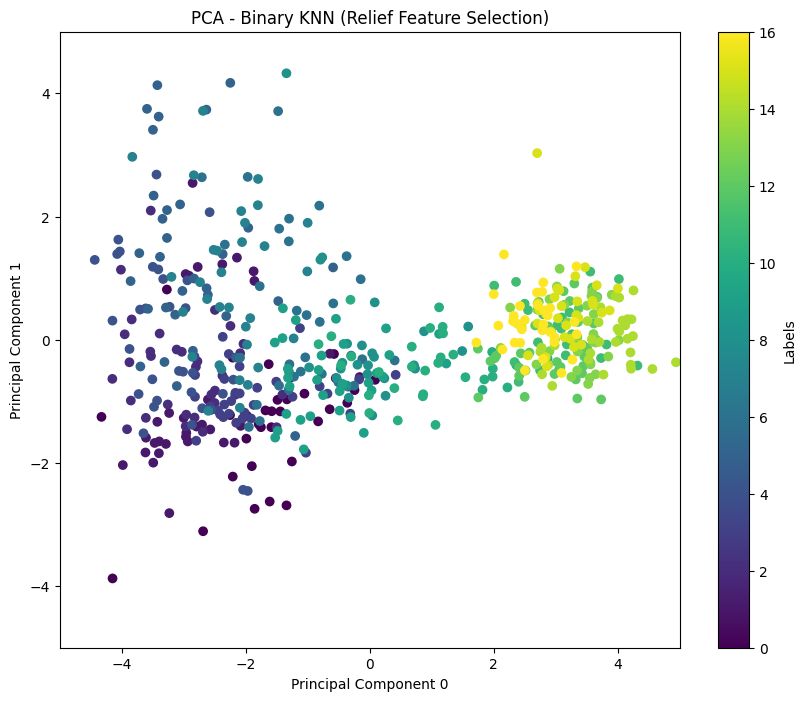

In [170]:
pca_plot(np.argsort(weights)[::-1][0:16], "PCA - Binary KNN (Relief Feature Selection)")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


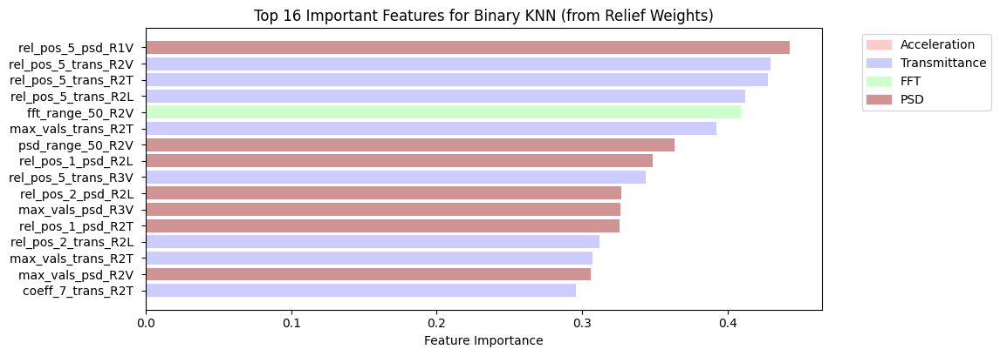

In [173]:
sorted_feature_indices = np.argsort(weights)[::-1] # get the indices of the most important features in descending order. np.max was found to have better predictive performance compared to np.mean and np.median and np.min
plot_ranking(sorted_feature_indices, weights, feature_labels, 16, 'Binary KNN (from Relief Weights)', [10, 4.2]) # 80 is where the elbow is located

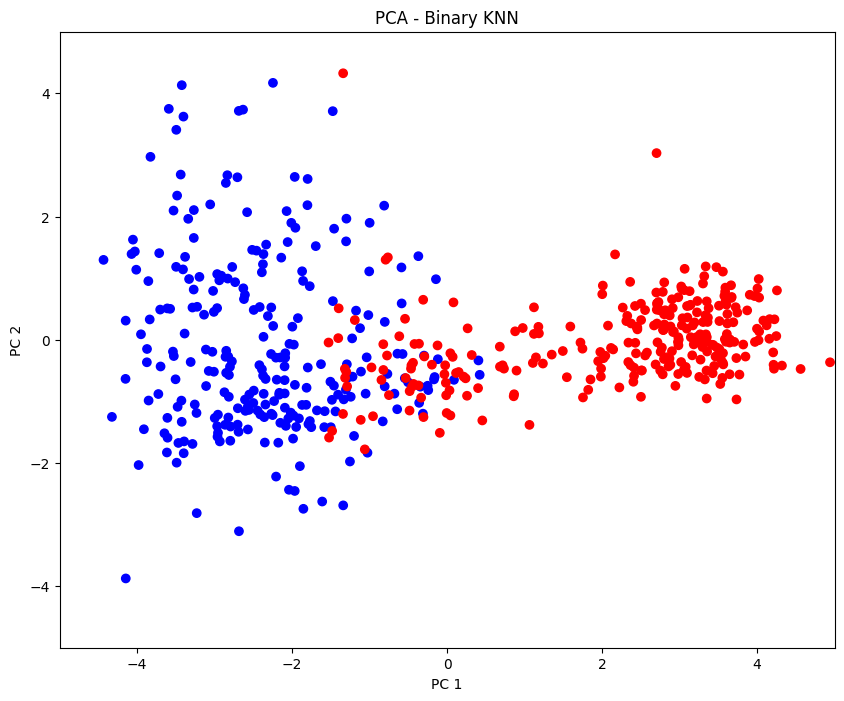

In [131]:
knn_feat = [303, 821, 747, 673, 191, 732, 189, 373, 895, 374, 582, 447, 670,
       731, 508, 701, 700, 699, 698, 756, 239, 683, 682, 608, 830, 237,
       758]
pca_plot_binary(knn_feat[0:16], "PCA - Binary KNN")